# Extract the spectrum of CTIO Data in November 2016
==================================================================================================

- author : Sylvie Dagoret-Campagne
- date   : December 15th 2016

The goal is to extract the spectrum after the rotation

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

from astropy.modeling import models
from astropy import units as u
from astropy import nddata
from astropy.io import fits
import re
import os

In [2]:
import ccdproc
print 'ccdproc version',ccdproc.__version__

from astropy.modeling import models

ccdproc version 1.0.1


In [3]:
from scipy import stats  
from scipy import ndimage
from datetime import datetime, timedelta
from mpl_toolkits.mplot3d import Axes3D
import scipy.signal

In [4]:
import bottleneck as bn  # numpy's masked median is slow...really slow (in version 1.8.1 and lower)
print 'bottleneck version',bn.__version__

bottleneck version 1.0.0


In [5]:
import photutils
from astropy.stats import sigma_clipped_stats
from photutils import daofind
from photutils import CircularAperture
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
#from photutils.background import Background2D
from photutils import Background2D, SigmaClip, MedianBackground

In [6]:
%load_ext Cython

In [7]:
from IPython.display import Image, display

In [8]:
import matplotlib
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

In [9]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (4, 4),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [10]:
############################################################################
def ensure_dir(f):
    d = os.path.dirname(f)
    if not os.path.exists(f):
        os.makedirs(f)
#########################################################################

In [11]:
inputdir="./rotated_fitsimages"
object_name='HD14943'

In [102]:
outputdir="./spectrum_fitsspec"

In [103]:
ensure_dir(outputdir)

## Location of corrected images
----------------------------------

In [14]:
input_filelist=os.listdir(inputdir) 

In [15]:
if '.DS_Store' in input_filelist:
    input_filelist.remove('.DS_Store')
input_filelist=np.array(input_filelist)

In [17]:
#print input_filelist

In [18]:
indexes_files= [] # global list
filelist_fitsimages= []  # global list

In [19]:
#%%cython

import numpy as np
import re

def MakeFileList(inputdir,input_filelist):
    """
    MakeFileList : Make The List of files to open
    =============
    """
    
#    import numpy as np
#    import re
    indexes_files= [] # global list
    filelist_fitsimages= []  # global list
    index=0

    
    for file in input_filelist: # loop on directories, one per image       
            filename=inputdir+'/'+file
            if re.search('.*fits$',filename):  #example of filename filter
                index=index+1
                filelist_fitsimages.append(filename)
                indexes_files.append(index)
    return indexes_files, filelist_fitsimages

In [20]:
indexes_files, filelist_fitsimages=MakeFileList(inputdir,input_filelist)   # Make the list

In [22]:
indexes_files=np.array(indexes_files)
filelist_fitsimages=np.array(filelist_fitsimages)

In [23]:
print indexes_files

[  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117]


In [24]:
sorted_indexes=np.argsort(indexes_files) # sort the file indexes

In [25]:
sorted_numbers=indexes_files[sorted_indexes]

In [26]:
print sorted_indexes

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116]


In [27]:
#sorted_files= [filelist_fitsimages[index] for index in sorted_indexes] # sort files
sorted_files=filelist_fitsimages[sorted_indexes]

In [26]:
#sorted_files

## Build full filename
----------------------------

In [28]:
sorted_filenames=[]
for file in sorted_files:
    #fullfilename=os.path.join(inputdir,file)
    fullfilename=file
    sorted_filenames.append(fullfilename)

In [29]:
#sorted_filenames=np.array(sorted_filenames)
sorted_filenames=np.copy(sorted_files)

In [30]:
print sorted_filenames.shape

(117,)


## Acces to data of  images
----------------------------------

In [31]:
all_dates = []
all_airmass = []
all_images = []
all_titles = []
all_header = []
all_img = []

In [32]:
%%cython

import numpy as np
from astropy.io import fits

def BuildImages(sorted_filenames,sorted_numbers,object_name):
    """
    BuildRawImages
    ===============
    """

    
    all_dates = []
    all_airmass = []
    all_images = []
    all_titles = []
    all_header = []
    all_expo = []
   
    NBFILES=sorted_filenames.shape[0]

    for idx in range(NBFILES):  
        
        file=sorted_filenames[idx]    
        
        hdu_list=fits.open(file)
        header=hdu_list[0].header
        #print header
        date_obs = header['DATE-OBS']
        airmass = header['AIRMASS']
        expo = header['EXPTIME']
        num=sorted_numbers[idx]
        title=object_name+" z= {:3.2f} Nb={}".format(float(airmass),num)
        image_corr=hdu_list[0].data
        image=image_corr
        
        all_dates.append(date_obs)
        all_airmass.append(float(airmass))
        all_images.append(image)
        all_titles.append(title)
        all_header.append(header)
        all_expo.append(expo)
        hdu_list.close()
        
    return all_dates,all_airmass,all_images,all_titles,all_header,all_expo

In [33]:
all_dates,all_airmass,all_images,all_titles,all_header,all_expo=BuildImages(sorted_files,sorted_numbers,object_name)

## Show images
-----------------------

In [34]:
len(all_images)

117

In [106]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
    
def ShowImages(all_images,all_titles,object_name):
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    """
    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/5)+1
    thex0 = []
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        xprofile=np.sum(all_images[index],axis=0)
        x0=np.where(xprofile==xprofile.max())[0][0]
        thex0.append(x0)
        im=axarr[iy,ix].imshow(all_images[index],vmin=-10,vmax=50)
        axarr[iy,ix].set_title(all_titles[index])
    title='Images of '.format(object_name)
    plt.suptitle(title,size=16)
    return thex0

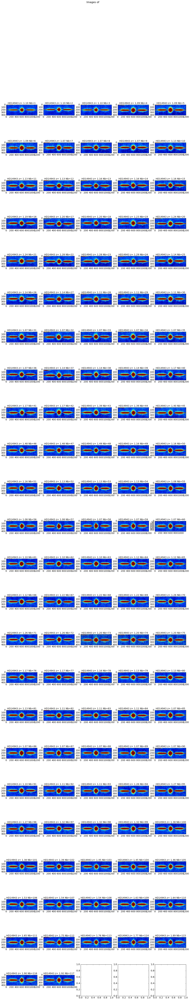

In [107]:
thex0=ShowImages(all_images,all_titles,object_name)

### Shows the transverse profile

In [108]:
DeltaX=600
w=20
ws=70

In [109]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
    
def ShowTransverseProfile(all_images,all_titles,object_name,all_expo):
    """
    ShowTransverseProfile: Show the raw images without background subtraction
    =====================
    """

    NBIMAGES=len(all_images)
    MAXIMGROW=int(NBIMAGES/5)+1
    DeltaX=600
    w=20
    ws=80
    thespectra= []
    they0= []
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBIMAGES):
        ix=index%5
        iy=index/5
        data=np.copy(all_images[index])
        data[:,DeltaX-ws:DeltaX+ws]=0
        yprofile=np.sum(data,axis=1)/all_expo[index]
        ymin=1
        ymax=yprofile.max()
        y0=np.where(yprofile==ymax)[0][0]
        they0.append(y0)
        #im=axarr[iy,ix].imshow(data,vmin=-10,vmax=50)
        axarr[iy,ix].semilogy(yprofile)
        axarr[iy,ix].semilogy([y0,y0],[ymin,ymax],'r-')
        axarr[iy,ix].semilogy([y0-w,y0-w],[ymin,ymax],'k-')
        axarr[iy,ix].semilogy([y0+w,y0+w],[ymin,ymax],'k-')
        spectrum2D=np.copy(data[y0-w:y0+w,:])
        xprofile=np.sum(spectrum2D,axis=0)
        thespectra.append(xprofile/(2.*float(w))/all_expo[index])
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
    title='Spectrum tranverse profile '.format(object_name)
    plt.suptitle(title,size=16)
    return thespectra,they0

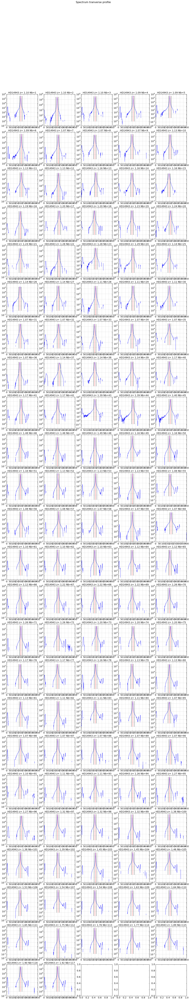

In [111]:
thespectra,they0=ShowTransverseProfile(all_images,all_titles,object_name,all_expo)

In [112]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
    
def ShowSpectrumProfile(spectra,all_titles,object_name):
    """
    ShowSpectrumProfile: Show the raw images without background subtraction
    =====================
    """
    NBSPEC=len(spectra)
    MAXIMGROW=int(NBSPEC/5)+1
    
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBSPEC):
        ix=index%5
        iy=index/5
        axarr[iy,ix].plot(spectra[index])
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        axarr[iy,ix].set_ylim(0.,200.)
    title='Spectrum 1D profile '.format(object_name)
    plt.suptitle(title,size=16)

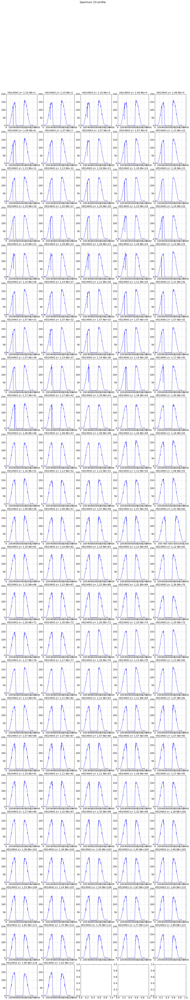

In [113]:
ShowSpectrumProfile(thespectra,all_titles,object_name)

## Example of a single spectrum

In [57]:
sel=68
spectrum_sel=thespectra[sel]

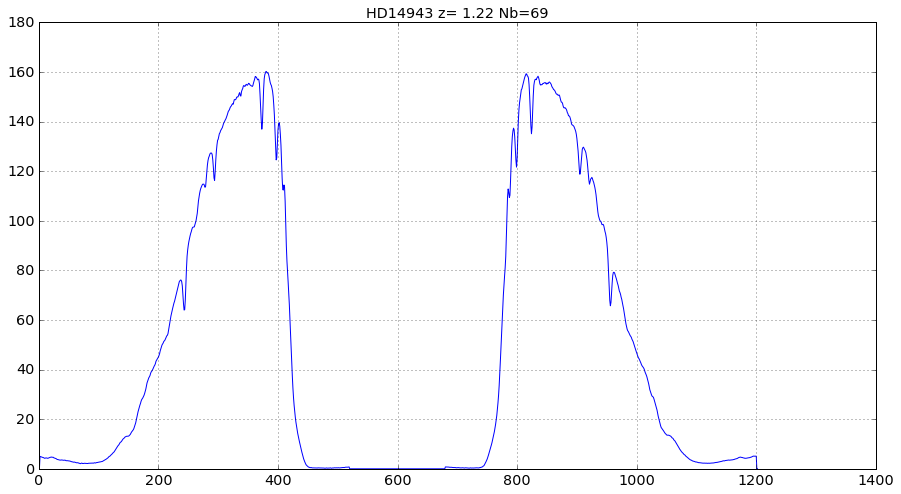

In [59]:
plt.figure(figsize=(15,8))
plt.plot(spectrum_sel)
title=all_titles[sel]
plt.title(title)
plt.grid(True)

## Cut the spectrum into two left/right part

In [68]:
xmin_center=450
xmax_center=750
skybg=1

In [54]:
def GetSpectrumBackground(inspectra,start,stop,skybg):
    '''
    Return the background    
    '''
    cropedbg=inspectra[start:stop]
    purebg=cropedbg[np.where(cropedbg!=skybg)]  # remove region of the bing star
    
    return purebg

In [55]:
def SeparateSpectra(inspectra,x0):
    '''
    Cut the two spectra
    '''
    rightspectra=inspectra[x0:]
    revleftspectra=inspectra[:x0]
    leftspectra=   revleftspectra[::-1]
    #rightspectra=rightspectra[np.where(rightspectra>0)]
    #leftspectra=leftspectra[np.where(leftspectra>0)]
    
    return leftspectra,rightspectra

In [56]:
def DiffSpectra(spec1,spec2,bg):
    '''
    Make the difference of the tow spectra 
    
    '''
    N1=spec1.shape[0]
    N2=spec2.shape[0]
    N=np.min([N1,N2])
    spec1_croped=spec1[0:N]
    spec2_croped=spec2[0:N]
    diff_spec=np.average((spec1_croped-spec2_croped)**2)/bg**2
    return diff_spec  

In [62]:
def FindCenter(fullspectrum,xmin,xmax,specbg):
    '''
    '''   
    all_x0=np.arange(xmin,xmax,1)
    NBPOINTS=np.shape(all_x0)
    chi2=np.zeros(NBPOINTS)
    for idx,x0 in np.ndenumerate(all_x0):
        spec1,spec2=SeparateSpectra(fullspectrum,x0)
        chi2[idx]=DiffSpectra(spec1,spec2,specbg)
    return all_x0,chi2

In [64]:
all_candidate_center,all_chi2=FindCenter(spectrum_sel,xmin_center,xmax_center,1)

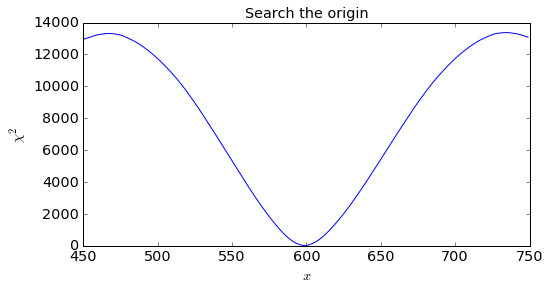

In [69]:
fig = plt.figure(figsize=(8,4))
plt.plot(all_candidate_center,all_chi2)
plt.title('Search the origin')
plt.ylabel('$\chi^2$')
plt.xlabel('$x$')
#plt.ylim(0,200.)

In [67]:
# find where is the minimum of chi2
indexmin=np.where(all_chi2==all_chi2.min())[0]
theorigin=all_candidate_center[indexmin]
print indexmin[0],theorigin[0],all_chi2.min()

 149 599 9.59367987389


In [76]:
spec1,spec2=SeparateSpectra(spectrum_sel,theorigin[0])

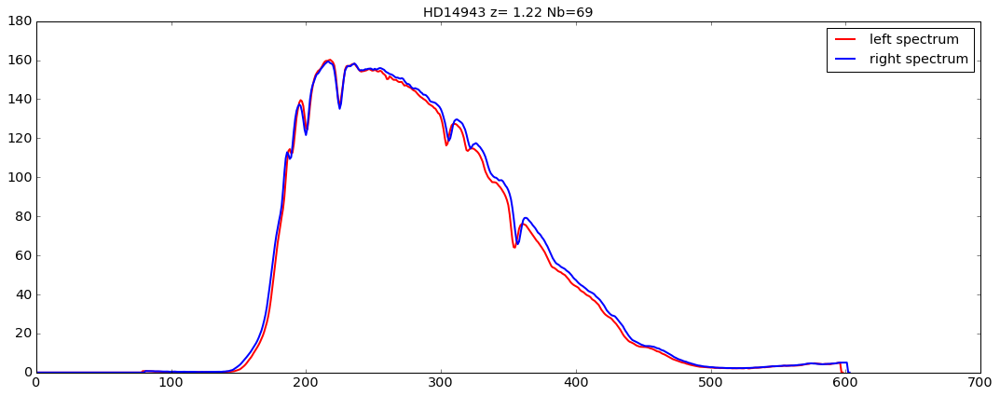

In [80]:
fig, ax = plt.subplots(figsize=(15, 6))
ax.plot(spec1,'r-',lw=2,label='left spectrum')
ax.plot(spec2,'b-',lw=2,label='right spectrum')
plt.title(title)
plt.tight_layout()
plt.legend(loc='best')

## Split Spectrum into two parts
----------------------------------------------

In [95]:
def SplitSpectrumProfile(spectra,all_titles,object_name):
    """
    SplitSpectrumProfile: Split the spectrum in two parts
    =====================
    """
    NBSPEC=len(spectra)
    MAXIMGROW=int(NBSPEC/5)+1
    
    skybg=1
    spectra_left=[]
    spectra_right=[]
    
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBSPEC):
        ix=index%5
        iy=index/5

        spectrum_sel=spectra[index]    
        all_candidate_center,all_chi2=FindCenter(spectrum_sel,xmin_center,xmax_center,skybg)
        
        indexmin=np.where(all_chi2==all_chi2.min())[0]
        theorigin=all_candidate_center[indexmin]
        
        spec1,spec2=SeparateSpectra(spectrum_sel,theorigin[0])
        
        spectra_left.append(spec1)
        spectra_right.append(spec2)
        
        axarr[iy,ix].plot(spec1,'r-',lw=1,label='left')
        axarr[iy,ix].plot(spec2,'b-',lw=1,label='right')
        axarr[iy,ix].legend(loc='best')                  
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
    
    title='Two 1D Spectra 1D for '.format(object_name)
    plt.suptitle(title,size=16)
    
    return spectra_left,spectra_right

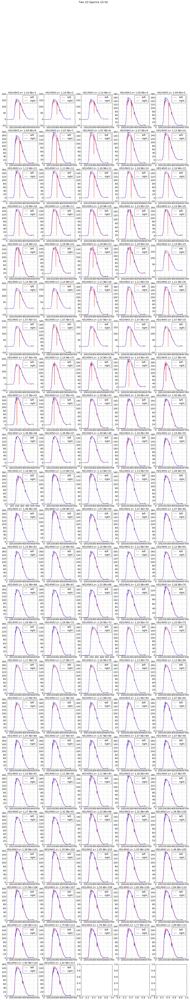

In [96]:
spectra_left,spectra_right=SplitSpectrumProfile(thespectra,all_titles,object_name)

In [97]:
def SupressDeadPixel(spectra,imin,imax,frac,all_titles,object_name):
    """
    SupressDeadPixel:
    =====================
    """
    NBSPEC=len(spectra)
    MAXIMGROW=int(NBSPEC/5)+1
    
    skybg=1
    spectra_list=[]
   
    
    f, axarr = plt.subplots(MAXIMGROW,5,figsize=(20,100))
    for index in np.arange(0,NBSPEC):
        ix=index%5
        iy=index/5

        spectrum_sel=np.copy(spectra[index])    
        
        for ipix in np.arange(imin,imax):
            thecurrent=spectrum_sel[ipix]
            theprevious=spectrum_sel[ipix-1]
            thenext=spectrum_sel[ipix+1]
            theav=np.mean(np.array([theprevious,thenext]))
            theratio=np.abs(thecurrent-theav)/theav
            if theratio > frac:
                spectrum_sel[ipix]=theav
                
            
        spectra_list.append(spectrum_sel)
        
        axarr[iy,ix].plot(spectrum_sel,'r-',lw=2)
        
        axarr[iy,ix].legend(loc='best')                  
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
    
    title=' Supress dead pixels for '.format(object_name)
    plt.suptitle(title,size=16)
    
    return spectra_list

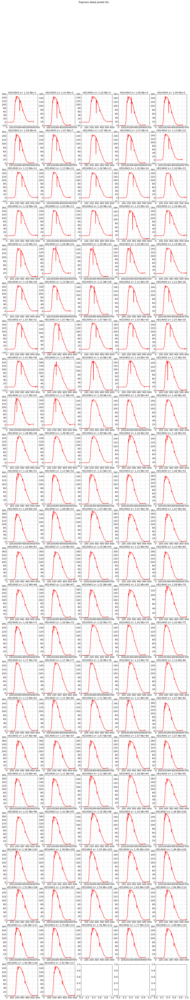

In [98]:
new_left_spectra=SupressDeadPixel(spectra_left,150,500,0.5,all_titles,object_name)

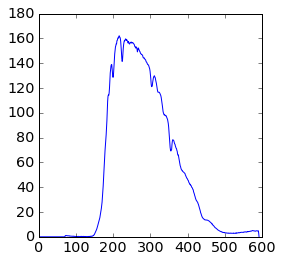

In [116]:
plt.plot(spectra_right[0])

## Gain Calibration

In [114]:
gains=np.linspace(0.5,1.5,1000)
NBGAINS=gains.shape[0]
chi2New=np.zeros(NBGAINS)

In [115]:
def DiffAmplitudes(sp1,sp2,gain,basebg):
    '''
    get the differences of the spectra for that gain
    '''    
    return DiffSpectra(gain*sp1,sp2,basebg)

In [ ]:
thegain=gains[np.where(chi2New==chi2New.min())]
print thegain

### prepare outputfilename

In [104]:
newfullfilenames=[]
for idx,file in np.ndenumerate(sorted_files):
    short_infilename=file.split("/")[2]
    short_partfilename=re.findall('^rotimg_(.*)',short_infilename)
    short_outfilename='finalSpectra_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

In [105]:
newfullfilenames

['./spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T01_45_51_1.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T01_46_55_2.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T01_47_58_3.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T01_52_42_4.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T01_54_05_5.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T01_55_29_6.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T02_27_22_7.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T02_28_46_8.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T02_30_09_9.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T04_36_28_10.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T04_37_52_11.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T04_39_16_12.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T04_55_21_13.fits',
 './spectrum_fitsspec/finalSpectra_HD14943_2016_11_23T04_56_

### Save outputfilename

In [117]:
for idx,file in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=spectra_right[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(file,clobber=True)

In [ ]:
!ls

In [ ]:
# !ls -l cut_fitsimages